The Project
This is a project with minimal scaffolding. Expect to use the the discussion forums to gain insights! It’s not cheating to ask others for opinions or perspectives!
Be inquisitive, try out new things.
Use the previous modules for insights into how to complete the functions! You'll have to combine Pillow, OpenCV, and Pytesseract
There are hints provided in Coursera, feel free to explore the hints if needed. Each hint provide progressively more details on how to solve the issue. This project is intended to be comprehensive and difficult if you do it without the hints.
The Assignment
Take a ZIP file of images and process them, using a library built into python that you need to learn how to use. A ZIP file takes several different files and compresses them, thus saving space, into one single file. The files in the ZIP file we provide are newspaper images (like you saw in week 3). Your task is to write python code which allows one to search through the images looking for the occurrences of keywords and faces. E.g. if you search for "pizza" it will return a contact sheet of all of the faces which were located on the newspaper page which mentions "pizza". This will test your ability to learn a new (library), your ability to use OpenCV to detect faces, your ability to use tesseract to do optical character recognition, and your ability to use PIL to composite images together into contact sheets.

Each page of the newspapers is saved as a single PNG image in a file called images.zip. These newspapers are in english, and contain a variety of stories, advertisements and images. Note: This file is fairly large (~200 MB) and may take some time to work with, I would encourage you to use small_img.zip for testing.

Here's an example of the output expected. Using the small_img.zip file, if I search for the string "Christopher" I should see the following image:Christopher SearchIf I were to use the images.zip file and search for "Mark" I should see the following image (note that there are times when there are no faces on a page, but a word is found!):Mark Search

Note: That big file can take some time to process - for me it took nearly ten minutes! Use the small one for testing.

In [65]:
from zipfile import ZipFile

from PIL import Image
import pytesseract
import cv2 as cv
import numpy as np
import kraken
from kraken import pageseg

# loading the face detection classifier
face_cascade = cv.CascadeClassifier('readonly/haarcascade_frontalface_default.xml')
eye_cascade = cv.CascadeClassifier('readonly/haarcascade_eye.xml')

# the rest is up to you!

In [4]:
#play with zipfile

#file = ZipFile("readonly/small_img.zip", "r")

with ZipFile("readonly/small_img.zip", 'r') as zipObj:
       # Extract all the contents of zip file in different directory
       zipObj.extractall('readonly/small_img')

In [5]:
im=Image.open("readonly/small_img/a-0.png")
width, height = im.size
print(width, height)

3600 6300


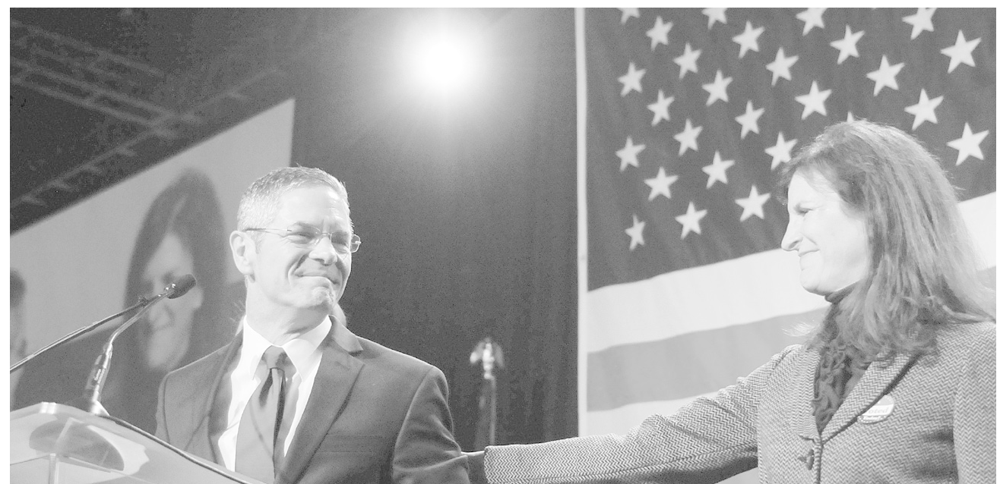

In [149]:
#let's try cropping columns

# found this cool utility to capture coords from image:
# http://nicodjimenez.github.io/boxLabel/annotate.html

im=Image.open("readonly/small_img/a-0.png")

# found this cool utility to capture coords from image:
# http://nicodjimenez.github.io/boxLabel/annotate.html
small_a0_crop_dict = {
    "summary_results":[87,1404,696,5913],
    "description":[744,3649,2832,3781],
    "column1":[730,4309,1271,5903],
    "column2":[1289,4343,1828,5902],
    "column3":[1846,4337,2377,5900],
    "column4":[2428,4468,2941,5899],
    "column5":[2968,4479,3461,5895],
    "pic1":[756,1704,3454,3483]
}

summary_results = im.crop((small_a0_crop_dict['summary_results']))
description = im.crop((small_a0_crop_dict["description"]))
column1 = im.crop((small_a0_crop_dict["column1"]))
column2 = im.crop((small_a0_crop_dict["column2"]))
column3 = im.crop((small_a0_crop_dict["column3"]))
column4 = im.crop((small_a0_crop_dict["column4"]))
column5 = im.crop((small_a0_crop_dict["column5"]))
pic1 = im.crop((small_a0_crop_dict["pic1"]))


#display(description)

im1=Image.open("readonly/small_img/a-1.png")

small_a1_crop_dict = {
    "pic1":[136,1104,1452,1742],
    "pic2":[1464,1423,2445,2120],
    "pic3":[611,2182,1463,2662],
    "pic4":[1468,2371,2583,2825],
    "description":[138,2964,2567,3152],
    "col1":[105,3530,675,4804],
    "col2":[684,3551,1219,4798],
    "col3":[1241,3553,1779,6167],
    "col4":[1819,3538,2358,6165],
    "col5":[2366,3535,2918,6164],
    "col6":[2924,3554,3484,6079],
    "cred1":[2617,537,3012,697],
    "cred2":[3034,546,3421,697],
    "cred3":[2606,1220,3436,3138]
}

pic1=im1.crop((small_a1_crop_dict["pic1"]))

display(pic1)

# for k, v in small_a1_crop_dict.items():
#     print(k, v)


In [162]:
#This scheme works pretty well.   Using the utility to create a dictionary of boxes for easier processing
#let create a class that takes the image and the box_crop_dict with methods to provide reports needed for the project

class GetImageInfo:
    """ extract text and faces from an image using a box_crop_dict"""

    def __init__(self, image_path, box_crop_dict):
        self.file_name = image_path
        self.counter = 1
        self.snip_text_dict = {}
        self.snips = []
        self.pics = []
        self.faces = []
        self.im=Image.open(image_path)
        self.box_crop_dict=box_crop_dict

        for k, v in self.box_crop_dict.items():
            if "pic" not in k:
                x = self.im.crop(v)
                self.snips.append(x)
            else:
                x = self.im.crop((v))
                self.pics.append(x)
                
        for snip in self.snips:
            snip_boxes = pageseg.segment(snip.convert('1'))['boxes']
            for snip_box in snip_boxes:
                target = snip.crop(snip_box)
                bigger = target.resize((int(target.width * 1.4), int(target.height * 1.4)))
                ret_val = pytesseract.image_to_string(bigger, lang='eng', config='--psm 7')
                self.snip_text_dict[self.counter] = [bigger, ret_val]
                self.counter += 1
                
        for pic in self.pics:
            pic = pic.convert("RGB")
            numpy_image=np.array(pic)
            opencv_image=cv.cvtColor(numpy_image, cv.COLOR_RGB2BGR)
            face_boxes = face_cascade.detectMultiScale(opencv_image)

            fixed_boxes = [(x[0],x[1],x[2]+x[0],x[3]+x[1]) for x in face_boxes]
            
            for box in fixed_boxes:
                face = pic.crop(box)
                self.faces.append(face)
                
        if self.faces:
            first_image=self.faces[0]
            self.contact_sheet=Image.new(first_image.mode, (first_image.width*4,first_image.height*2))
            x=0
            y=0
            for face in self.faces:
                self.contact_sheet.paste(face, (x, y) )
                if x+first_image.width == self.contact_sheet.width:
                    x=0
                    y=y+first_image.height
                else:
                    x=x+first_image.width
            # resize and display the contact sheet
            self.contact_sheet = self.contact_sheet.resize((int(self.contact_sheet.width/2),int(self.contact_sheet.height/2) ))
                            
    def print_snips(self):
        for snip in self.snips:
            display(snip)
            
    def print_pics(self):
        for pic in self.pics:
            display(pic)
            
    def return_snip_text_dict(self):
        return self.snip_text_dict
    
    def print_faces(self):
        for face in self.faces:
            display(face)
    
    def print_contact_sheet(self):
        display(self.contact_sheet)
            
    def string_search(self, string):
        self.ret_text = "default"
        for t in self.snip_text_dict.values():
            if string in t[1]:
                self.ret_text = "Results found in file {}".format(self.file_name)
                break

        if self.contact_sheet and "found" in self.ret_text:
            print(self.ret_text)
            display(self.contact_sheet)
        elif "found" in self.ret_text and not self.contact_sheet:
            print(self.ret_text)
            print("But there were no faces in that file!")

            
            
    
            


Small_0 = GetImageInfo("readonly/small_img/a-0.png", small_a0_crop_dict)
Small_1 = GetImageInfo("readonly/small_img/a-1.png", small_a1_crop_dict)

Results found in file readonly/small_img/a-0.png


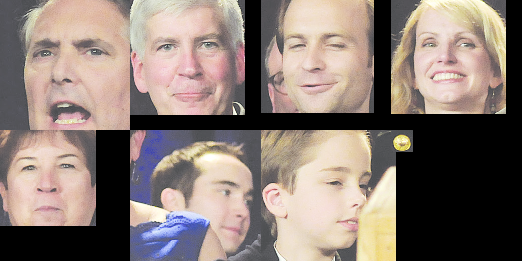

In [163]:
Small_0.string_search("Chris")
Small_1.string_search("Chris")




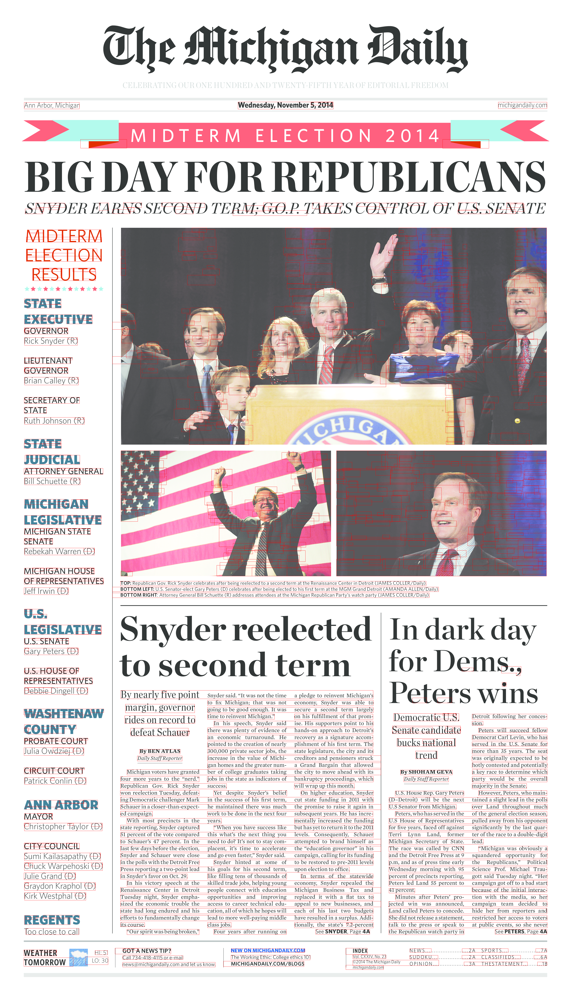

In [14]:
def show_boxes(img, bounding_boxes):
    '''Modifies the passed image to show a series of bounding boxes on an image as run by kraken
    
    :param img: A PIL.Image object
    :return img: The modified PIL.Image object
    '''
    # Lets bring in our ImageDraw object
    from PIL import ImageDraw
    # And grab a drawing object to annotate that image
    drawing_object=ImageDraw.Draw(img)
    # We can create a set of boxes using pageseg.segment
    #bounding_boxes=pageseg.segment(img.convert('1'))['boxes']
    # Now lets go through the list of bounding boxes
    for box in bounding_boxes:
        # An just draw a nice rectangle
        drawing_object.rectangle(box, fill = None, outline ='red')
    # And to make it easy, lets return the image object
    return img

# To test this, lets use display
display(show_boxes(im, bounding_boxes))